<a href="https://colab.research.google.com/github/Volhamster/ML_labs/blob/main/Kotova_RK2_IU9_31.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Variational AutoEncoder
Котова ИУ9-31м

## Setup


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import random 

Датасет fashion MNIST содержит следующие классы:

<table>
  <tr>
    <th>Label</th>
    <th>Class</th>
  </tr>
  <tr>
    <td>0</td>
    <td>T-shirt/top</td>
  </tr>
  <tr>
    <td>1</td>
    <td>Trouser</td>
  </tr>
    <tr>
    <td>2</td>
    <td>Pullover</td>
  </tr>
    <tr>
    <td>3</td>
    <td>Dress</td>
  </tr>
    <tr>
    <td>4</td>
    <td>Coat</td>
  </tr>
    <tr>
    <td>5</td>
    <td>Sandal</td>
  </tr>
    <tr>
    <td>6</td>
    <td>Shirt</td>
  </tr>
    <tr>
    <td>7</td>
    <td>Sneaker</td>
  </tr>
    <tr>
    <td>8</td>
    <td>Bag</td>
  </tr>
    <tr>
    <td>9</td>
    <td>Ankle boot</td>
  </tr>
</table>

# Исходный пример для fashion MNIST

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 14, 14, 32)   320         ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 7, 7, 64)     18496       ['conv2d[0][0]']                 
                                                                                                  
 flatten (Flatten)              (None, 3136)         0           ['conv2d_1[0][0]']               
                                                                                            

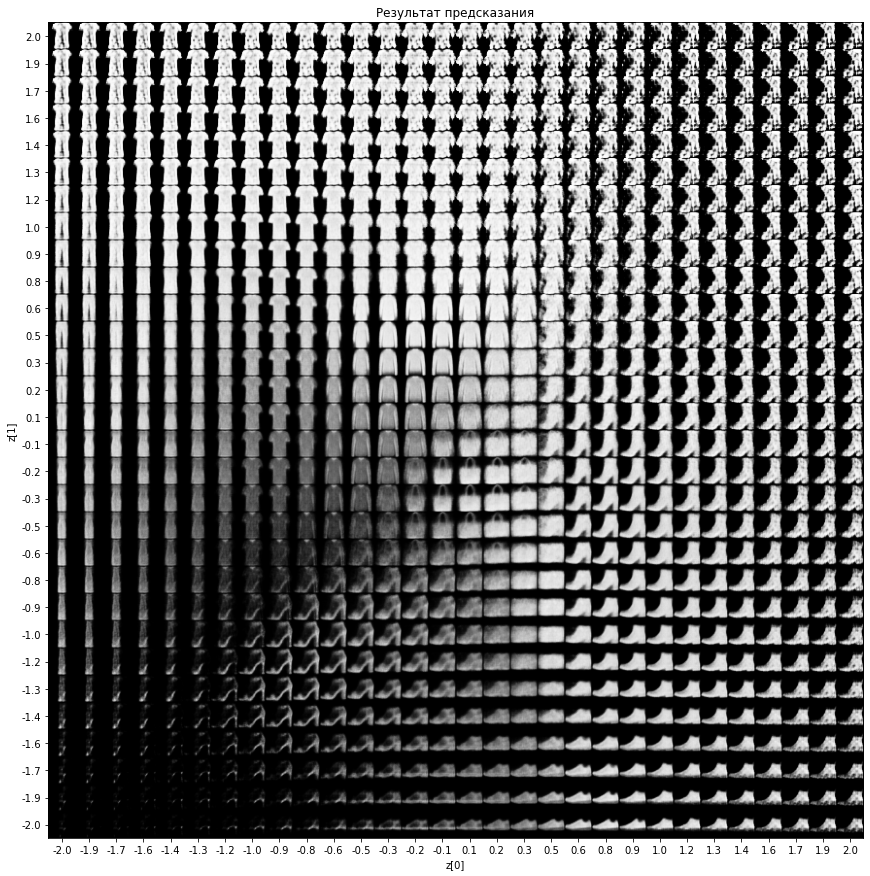

1/1 [==============================] - 0s 42ms/step


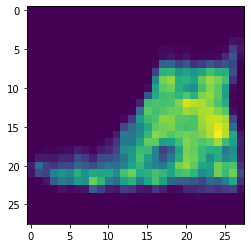

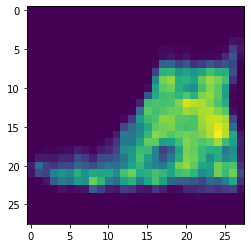

1875/1875 [==============================] - 4s 2ms/step


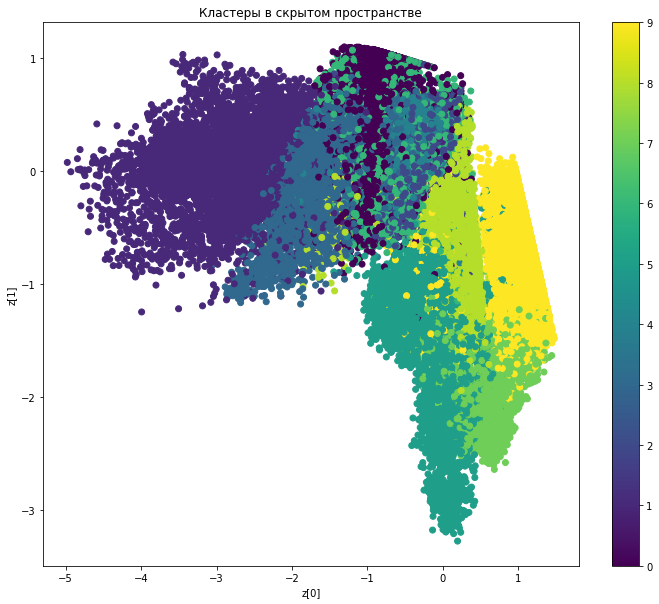

1/1 [==============================] - 0s 18ms/step


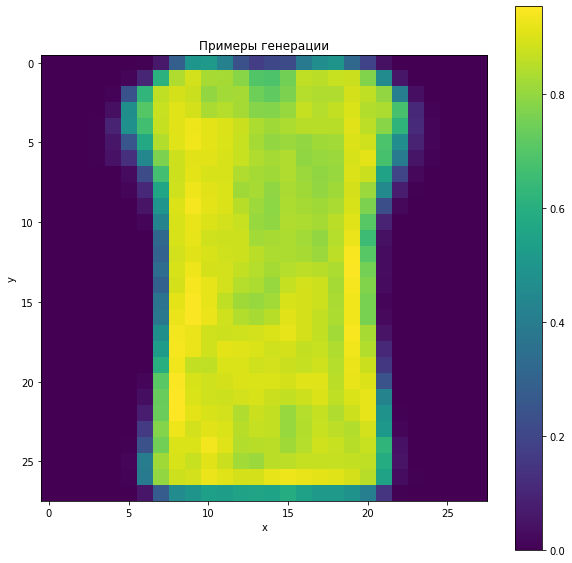

In [ ]:
# Строим слой семплирования sampling layer
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a picture."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# Строим энкодер encoder
latent_dim = 2

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

# Строим свой decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 64))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

# Создаем класс модель по `Model` с особым шагом обучения`train_step`
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(
                keras.losses.binary_crossentropy(data, reconstruction)
            )
            reconstruction_loss *= 28 * 28
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

# Учим VAE
(x_train, _), (x_test, _) = keras.datasets.fashion_mnist.load_data()
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
fashion_mnist = np.concatenate([x_train, x_test], axis=0)
fashion_mnist = np.expand_dims(fashion_mnist, -1).astype("float32") / 255

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(fashion_mnist, epochs=10, batch_size=128)

vae.fit(fashion_mnist, epochs=50, batch_size=128)

# Результат предсказания
def plot_latent(encoder, decoder):
    # display a n*n 2D manifold of pics
    n = 30
    pic_size = 28
    scale = 2.0
    figsize = 15
    figure = np.zeros((pic_size * n, pic_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of pic classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
                i * pic_size : (i + 1) * pic_size,
                j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(encoder, decoder)

x_decoded = decoder.predict([[1.990,-1.5]])
plt.imshow(x_decoded[0,:,:,0] )
plt.show()

plt.imshow(x_decoded[0,:,:,0] )
plt.show()

# Посмотрим на кластеры в скрытом пространстве
def plot_label_clusters(encoder, data, labels):
    # display a 2D plot of the pic classes in the latent space
    z_mean, _, _ = encoder.predict(data,verbose = 0)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.title("Кластеры в скрытом пространстве")
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()


(x_train, y_train), _ = keras.datasets.fashion_mnist.load_data()
x_train = np.expand_dims(x_train, -1).astype("float32") / 255

plot_label_clusters(encoder, x_train, y_train)

# Построим немного примеров генерации
def plot_pic_from_decoder(decoder, z, pic_size):
    # display a 2D plot of the pic classes in the latent space
    
    data = np.array([[z[0], z[1]]])
    pic = decoder.predict(data, verbose = 0)
    pic = pic.reshape(pic_size, pic_size)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(pic)
    plt.colorbar()
    plt.title("Примеры генерации")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()


plot_pic_from_decoder(decoder, [-1.5,1.], 28)

# Изменение слоев

## Изменение функции активации на сигмоиду

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_6 (Conv2D)              (None, 14, 14, 32)   320         ['input_7[0][0]']                
                                                                                                  
 conv2d_7 (Conv2D)              (None, 7, 7, 64)     18496       ['conv2d_6[0][0]']               
                                                                                                  
 flatten_3 (Flatten)            (None, 3136)         0           ['conv2d_7[0][0]']               
                                                                                            

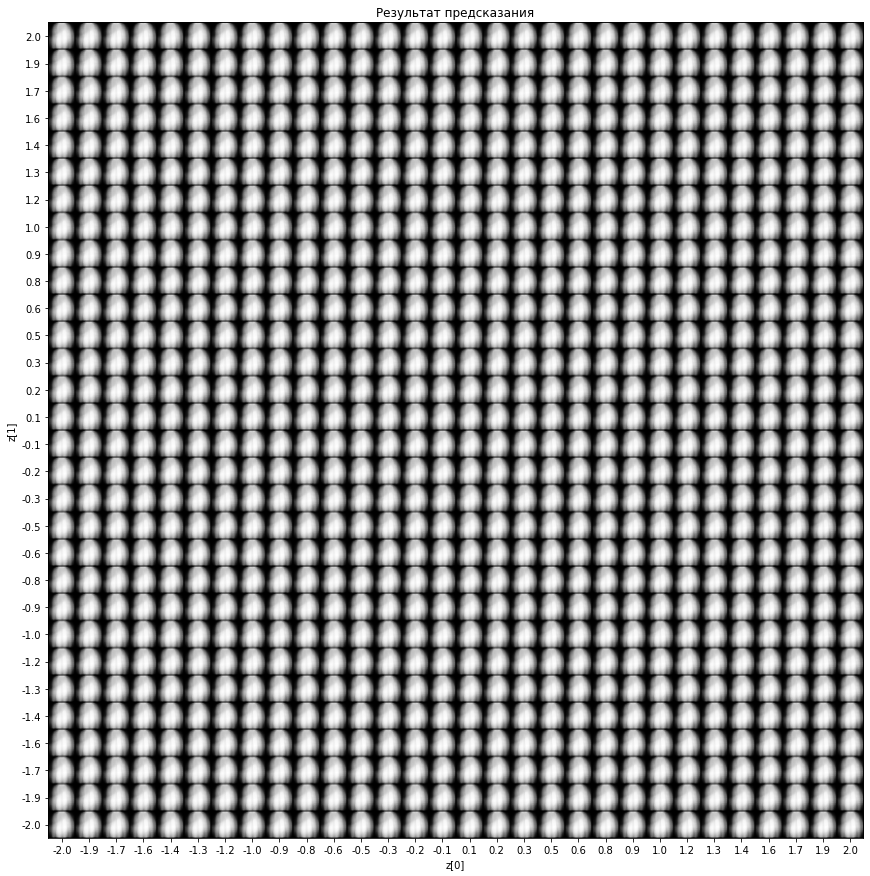

1/1 [==============================] - 0s 45ms/step


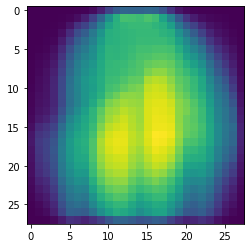

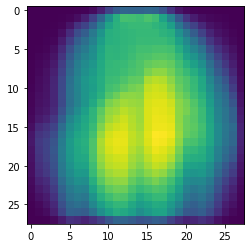

1875/1875 [==============================] - 3s 2ms/step


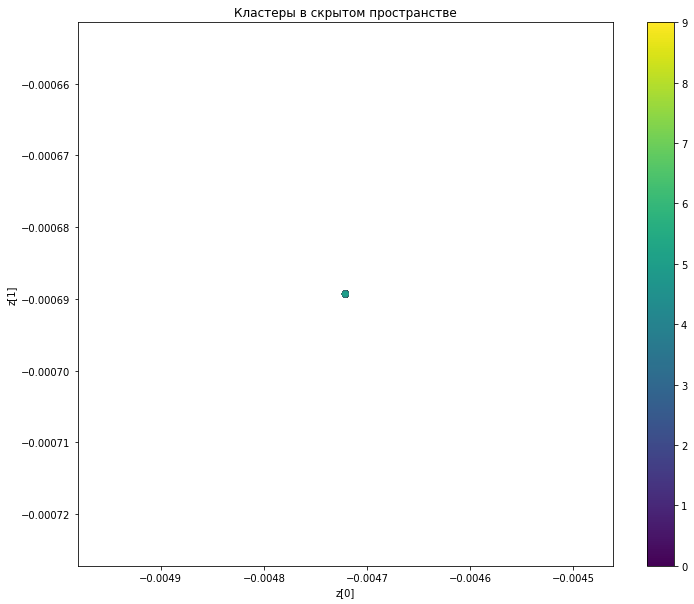

1/1 [==============================] - 0s 15ms/step


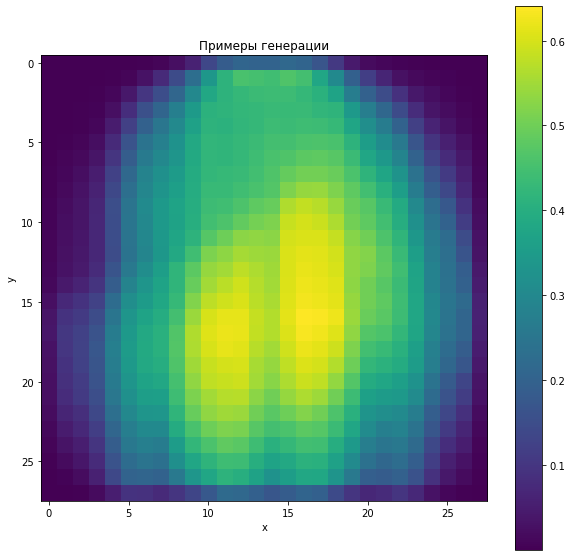

In [ ]:
# Строим слой семплирования sampling layer
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a picture."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# Строим энкодер encoder
latent_dim = 2

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="sigmoid", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

# Строим свой decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 64))(x)
x = layers.Conv2DTranspose(64, 3, activation="sigmoid", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

# Создаем класс модель по `Model` с особым шагом обучения`train_step`
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(
                keras.losses.binary_crossentropy(data, reconstruction)
            )
            reconstruction_loss *= 28 * 28
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

# Учим VAE
(x_train, _), (x_test, _) = keras.datasets.fashion_mnist.load_data()
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
fashion_mnist = np.concatenate([x_train, x_test], axis=0)
fashion_mnist = np.expand_dims(fashion_mnist, -1).astype("float32") / 255

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(fashion_mnist, epochs=10, batch_size=128, verbose = 0)

vae.fit(fashion_mnist, epochs=50, batch_size=128)

# Результат предсказания
def plot_latent(encoder, decoder):
    # display a n*n 2D manifold of pics
    n = 30
    pic_size = 28
    scale = 2.0
    figsize = 15
    figure = np.zeros((pic_size * n, pic_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of pic classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
                i * pic_size : (i + 1) * pic_size,
                j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(encoder, decoder)

x_decoded = decoder.predict([[1.990,-1.5]])
plt.imshow(x_decoded[0,:,:,0] )
plt.show()

plt.imshow(x_decoded[0,:,:,0] )
plt.show()

# Посмотрим на кластеры в скрытом пространстве
def plot_label_clusters(encoder, data, labels):
    # display a 2D plot of the pic classes in the latent space
    z_mean, _, _ = encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.title("Кластеры в скрытом пространстве")
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()


(x_train, y_train), _ = keras.datasets.fashion_mnist.load_data()
x_train = np.expand_dims(x_train, -1).astype("float32") / 255

plot_label_clusters(encoder, x_train, y_train)

# Построим немного примеров генерации
def plot_pic_from_decoder(decoder, z, pic_size):
    # display a 2D plot of the pic classes in the latent space
    
    data = np.array([[z[0], z[1]]])
    pic = decoder.predict(data)
    pic = pic.reshape(pic_size, pic_size)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(pic)
    plt.colorbar()
    plt.title("Примеры генерации")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()


plot_pic_from_decoder(decoder, [-1.5,1.], 28)

Сигмоида не подходит для данной задачи, не справляется

## Добавление количества слоев

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_26 (Conv2D)             (None, 14, 14, 16)   160         ['input_21[0][0]']               
                                                                                                  
 conv2d_27 (Conv2D)             (None, 7, 7, 32)     4640        ['conv2d_26[0][0]']              
                                                                                                  
 conv2d_28 (Conv2D)             (None, 4, 4, 64)     18496       ['conv2d_27[0][0]']              
                                                                                            

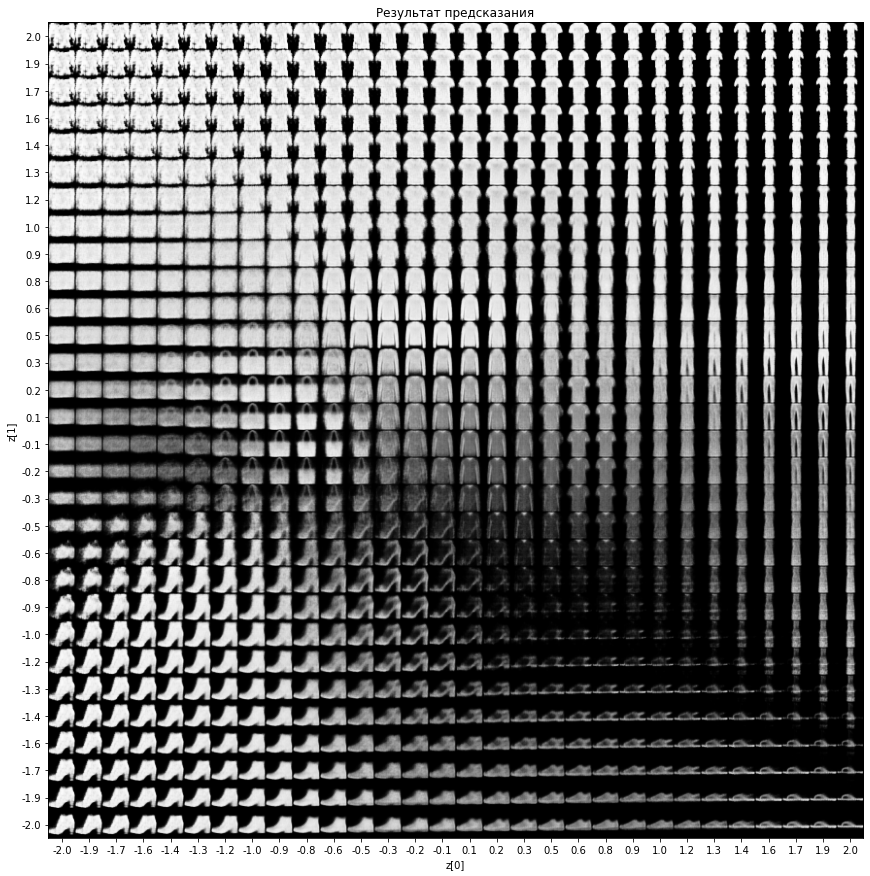

1/1 [==============================] - 0s 42ms/step


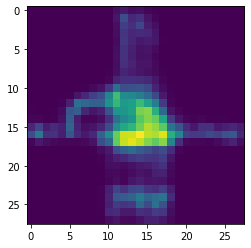

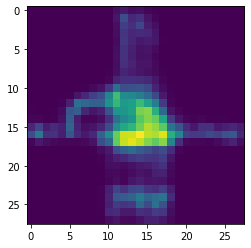

1875/1875 [==============================] - 4s 2ms/step


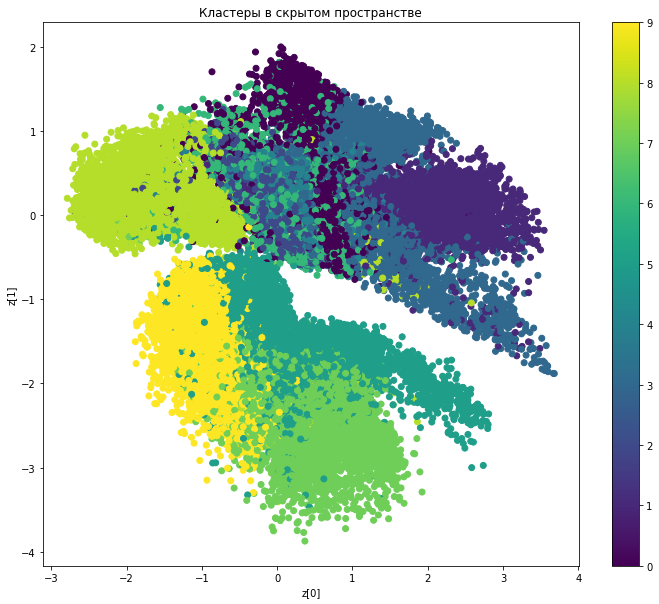

1/1 [==============================] - 0s 29ms/step


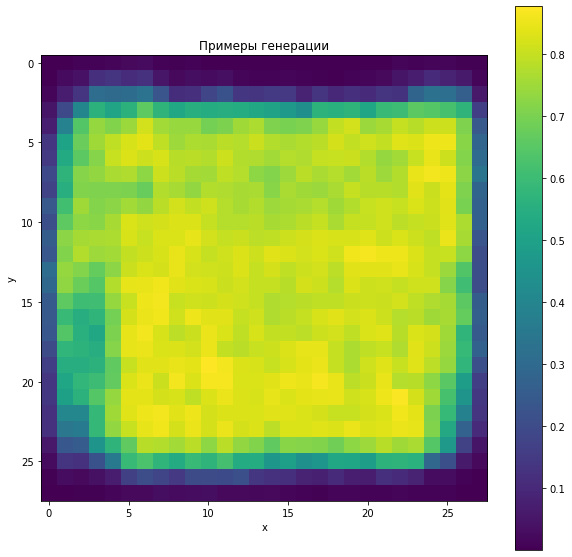

In [ ]:
# Строим слой семплирования sampling layer
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a picture."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# Строим энкодер encoder
latent_dim = 2

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(16, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(32, activation="relu")(x)
x = layers.Dense(8, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

# Строим свой decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 2, activation="relu")(latent_inputs)
x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 64))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

# Создаем класс модель по `Model` с особым шагом обучения`train_step`
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(
                keras.losses.binary_crossentropy(data, reconstruction)
            )
            reconstruction_loss *= 28 * 28
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

# Учим VAE
(x_train, _), (x_test, _) = keras.datasets.fashion_mnist.load_data()
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
fashion_mnist = np.concatenate([x_train, x_test], axis=0)
fashion_mnist = np.expand_dims(fashion_mnist, -1).astype("float32") / 255

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(fashion_mnist, epochs=10, batch_size=128, verbose = 0)

vae.fit(fashion_mnist, epochs=50, batch_size=128)

# Результат предсказания
def plot_latent(encoder, decoder):
    # display a n*n 2D manifold of pics
    n = 30
    pic_size = 28
    scale = 2.0
    figsize = 15
    figure = np.zeros((pic_size * n, pic_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of pic classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
                i * pic_size : (i + 1) * pic_size,
                j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(encoder, decoder)

x_decoded = decoder.predict([[1.990,-1.5]])
plt.imshow(x_decoded[0,:,:,0] )
plt.show()

plt.imshow(x_decoded[0,:,:,0] )
plt.show()

# Посмотрим на кластеры в скрытом пространстве
def plot_label_clusters(encoder, data, labels):
    # display a 2D plot of the pic classes in the latent space
    z_mean, _, _ = encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.title("Кластеры в скрытом пространстве")
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()


(x_train, y_train), _ = keras.datasets.fashion_mnist.load_data()
x_train = np.expand_dims(x_train, -1).astype("float32") / 255

plot_label_clusters(encoder, x_train, y_train)

# Построим немного примеров генерации
def plot_pic_from_decoder(decoder, z, pic_size):
    # display a 2D plot of the pic classes in the latent space
    
    data = np.array([[z[0], z[1]]])
    pic = decoder.predict(data)
    pic = pic.reshape(pic_size, pic_size)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(pic)
    plt.colorbar()
    plt.title("Примеры генерации")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()


plot_pic_from_decoder(decoder, [-1.5,1.], 28)

В латентном пространстве картинки кроме как в одной из диагоналей стали четче даже в переходе. Правда, все равно оставались "прорехи" с неразборчивыми изображениями по "главной" диагонали.

## Добавление пулинга

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_35 (InputLayer)          [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_43 (Conv2D)             (None, 14, 14, 32)   320         ['input_35[0][0]']               
                                                                                                  
 max_pooling2d_6 (MaxPooling2D)  (None, 7, 7, 32)    0           ['conv2d_43[0][0]']              
                                                                                                  
 flatten_17 (Flatten)           (None, 1568)         0           ['max_pooling2d_6[0][0]']        
                                                                                            

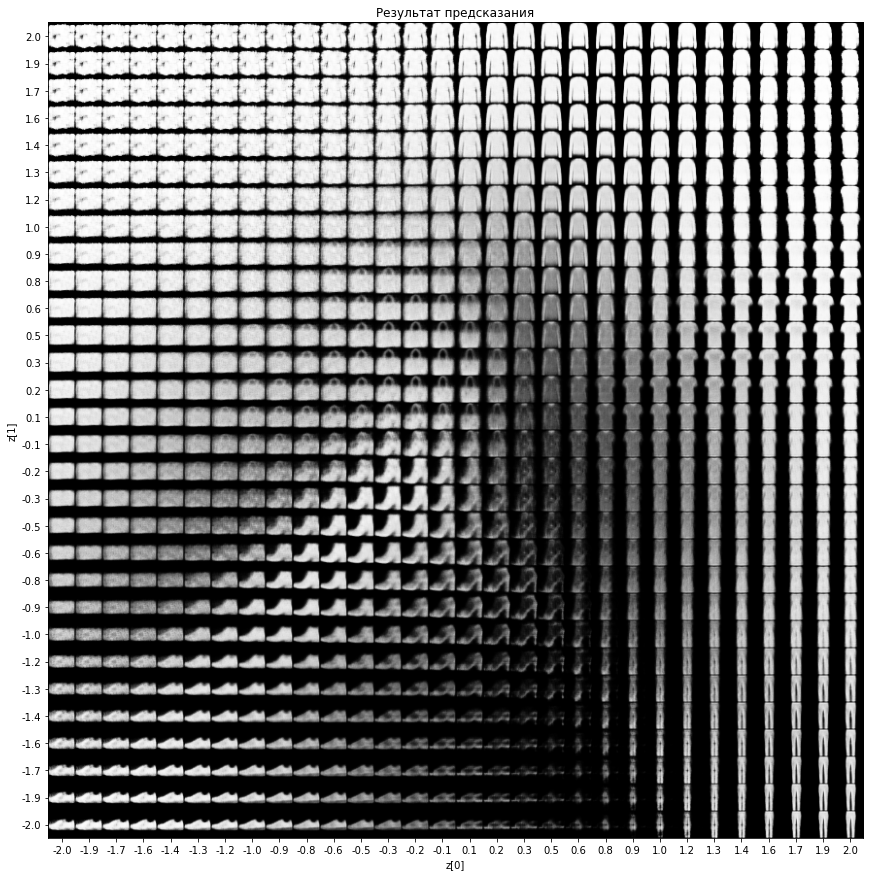

1/1 [==============================] - 0s 35ms/step


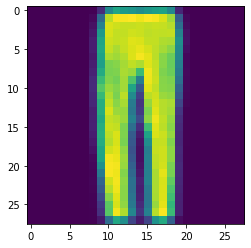

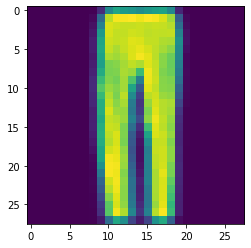

1875/1875 [==============================] - 3s 2ms/step


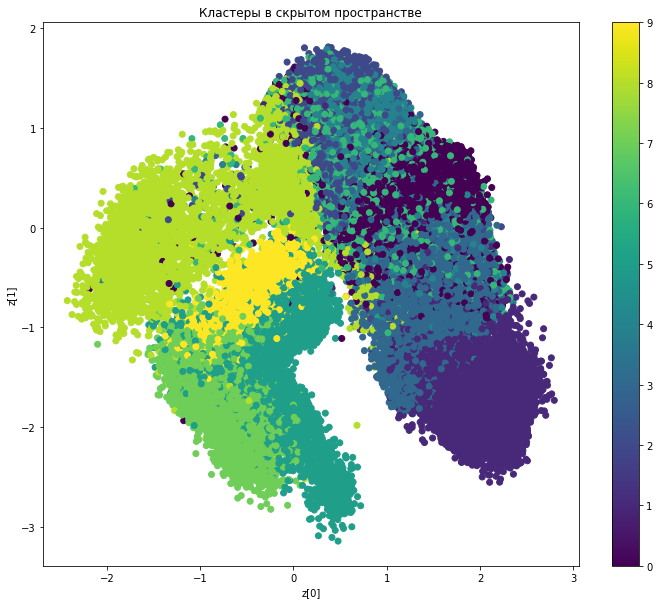

1/1 [==============================] - 0s 14ms/step


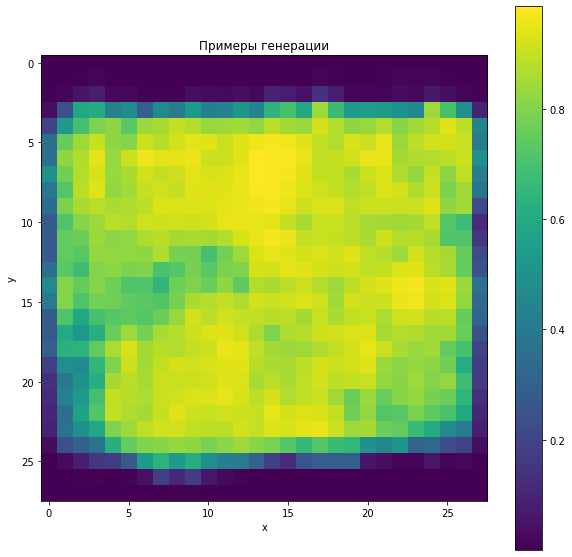

In [ ]:
# Строим слой семплирования sampling layer
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a picture."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# Строим энкодер encoder
latent_dim = 2

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

# Строим свой decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 64))(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

# encoder_inputs = keras.Input(shape=(28, 28, 1))
# x = layers.Conv2D(16, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
# x = layers.MaxPooling2D((2, 2), padding="same")(x)
# x = layers.Flatten()(x)
# x = layers.Dense(32, activation="relu")(x)
# x = layers.Dense(8, activation="relu")(x)
# z_mean = layers.Dense(latent_dim, name="z_mean")(x)
# z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
# z = Sampling()([z_mean, z_log_var])
# encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
# encoder.summary()

# # Строим свой decoder
# latent_inputs = keras.Input(shape=(latent_dim,))
# x = layers.Dense(8, activation="relu")(latent_inputs)
# x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
# x = layers.Reshape((7, 7, 64))(x)
# # x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
# x = layers.UpSampling2D((2, 2))(x)
# x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
# decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
# decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
# decoder.summary()

# Создаем класс модель по `Model` с особым шагом обучения`train_step`
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(
                keras.losses.binary_crossentropy(data, reconstruction)
            )
            reconstruction_loss *= 28 * 28
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

# Учим VAE
(x_train, _), (x_test, _) = keras.datasets.fashion_mnist.load_data()
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
fashion_mnist = np.concatenate([x_train, x_test], axis=0)
fashion_mnist = np.expand_dims(fashion_mnist, -1).astype("float32") / 255

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(fashion_mnist, epochs=10, batch_size=128, verbose = 0)

vae.fit(fashion_mnist, epochs=50, batch_size=128)

# Результат предсказания
def plot_latent(encoder, decoder):
    # display a n*n 2D manifold of pics
    n = 30
    pic_size = 28
    scale = 2.0
    figsize = 15
    figure = np.zeros((pic_size * n, pic_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of pic classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
                i * pic_size : (i + 1) * pic_size,
                j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(encoder, decoder)

x_decoded = decoder.predict([[1.990,-1.5]])
plt.imshow(x_decoded[0,:,:,0] )
plt.show()

plt.imshow(x_decoded[0,:,:,0] )
plt.show()

# Посмотрим на кластеры в скрытом пространстве
def plot_label_clusters(encoder, data, labels):
    # display a 2D plot of the pic classes in the latent space
    z_mean, _, _ = encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.title("Кластеры в скрытом пространстве")
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()


(x_train, y_train), _ = keras.datasets.fashion_mnist.load_data()
x_train = np.expand_dims(x_train, -1).astype("float32") / 255

plot_label_clusters(encoder, x_train, y_train)

# Построим немного примеров генерации
def plot_pic_from_decoder(decoder, z, pic_size):
    # display a 2D plot of the pic classes in the latent space
    
    data = np.array([[z[0], z[1]]])
    pic = decoder.predict(data)
    pic = pic.reshape(pic_size, pic_size)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(pic)
    plt.colorbar()
    plt.title("Примеры генерации")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()


plot_pic_from_decoder(decoder, [-1.5,1.], 28)

Кажется, что с добавлением пулинга картина либо не изменилась, либо стала хуже. 

# Изменение размера латентного пространства


## Латентное пространство: 4



In [ ]:
# Строим слой семплирования sampling layer
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a picture."""
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# Строим энкодер encoder
latent_dim = 4

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

# Строим свой decoder
latent_inputs = keras.Input(shape=(4,))
x = layers.Dense(7 * 7 * 8, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 8))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

# Создаем класс модель по `Model` с особым шагом обучения`train_step`
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(keras.losses.binary_crossentropy(data, reconstruction))
            reconstruction_loss *= 28 * 28
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {"loss": total_loss, 
                "reconstruction_loss": reconstruction_loss, 
                "kl_loss": kl_loss,}

# Учим VAE
(x_train, _), (x_test, _) = keras.datasets.fashion_mnist.load_data()
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
fashion_mnist = np.concatenate([x_train, x_test], axis=0)
fashion_mnist = np.expand_dims(fashion_mnist, -1).astype("float32") / 255

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(fashion_mnist, epochs=10, batch_size=128)

vae.fit(fashion_mnist, epochs=50, batch_size=128, verbose = 0)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_2 (Conv2D)              (None, 14, 14, 32)   320         ['input_3[0][0]']                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 7, 7, 64)     18496       ['conv2d_2[0][0]']               
                                                                                                  
 flatten_1 (Flatten)            (None, 3136)         0           ['conv2d_3[0][0]']               
                                                                                            

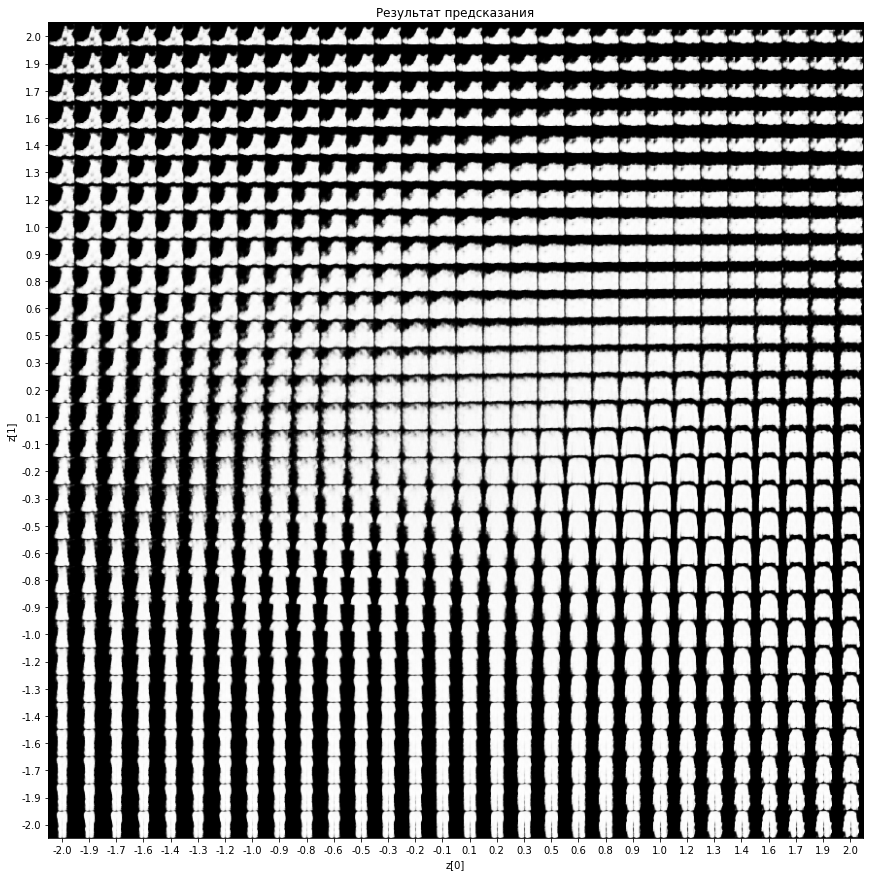

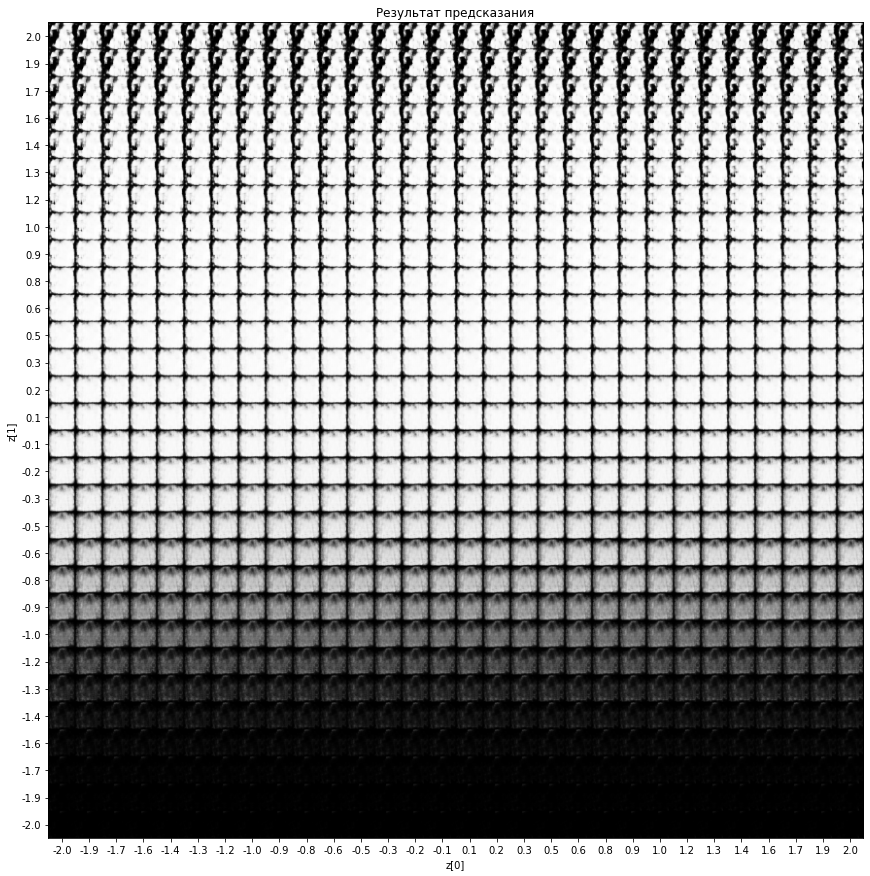

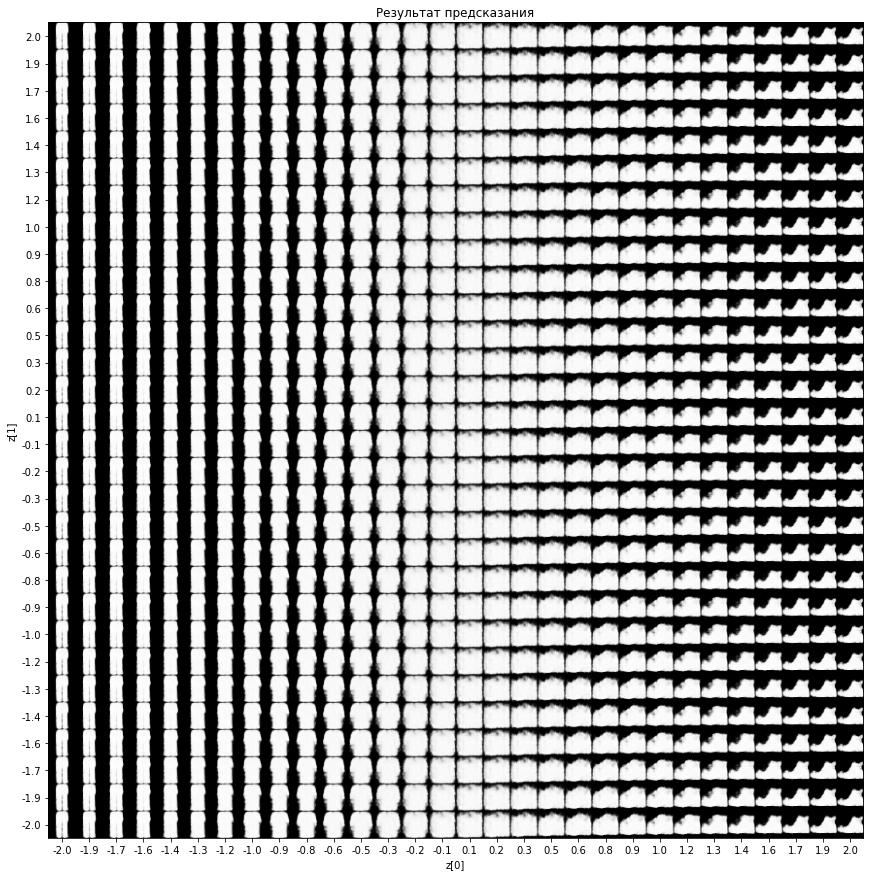

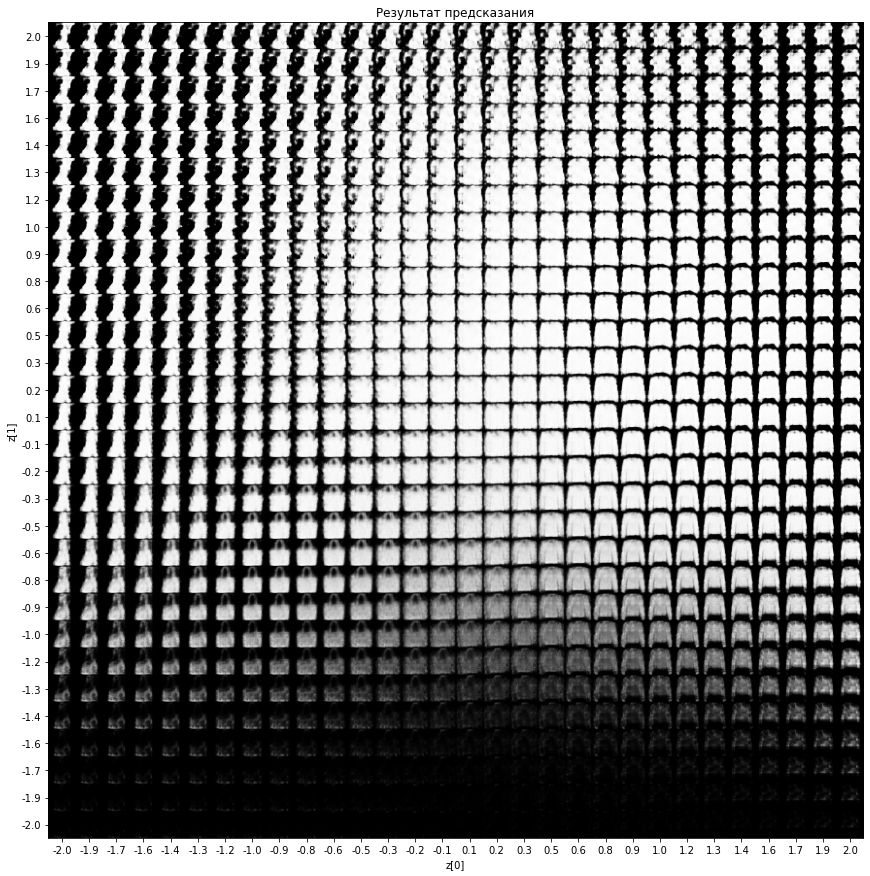

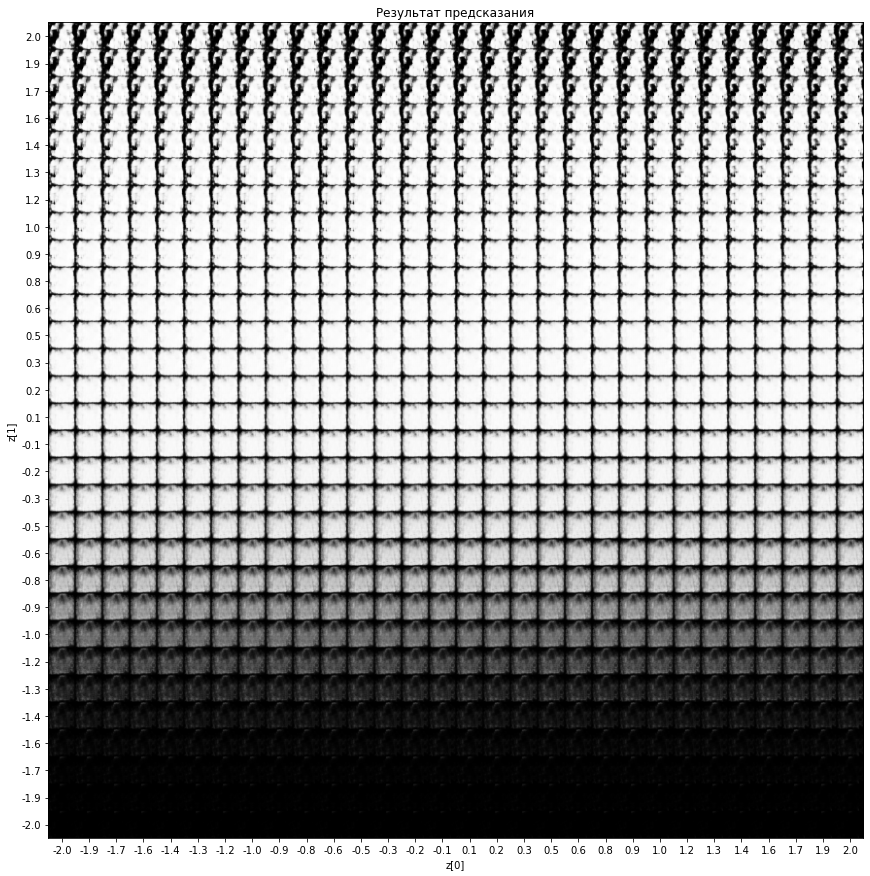

1/1 [==============================] - 0s 40ms/step


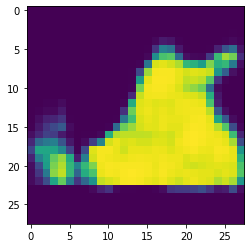

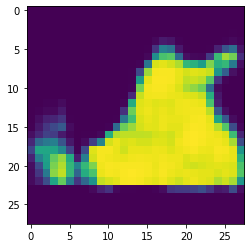

1875/1875 [==============================] - 4s 2ms/step


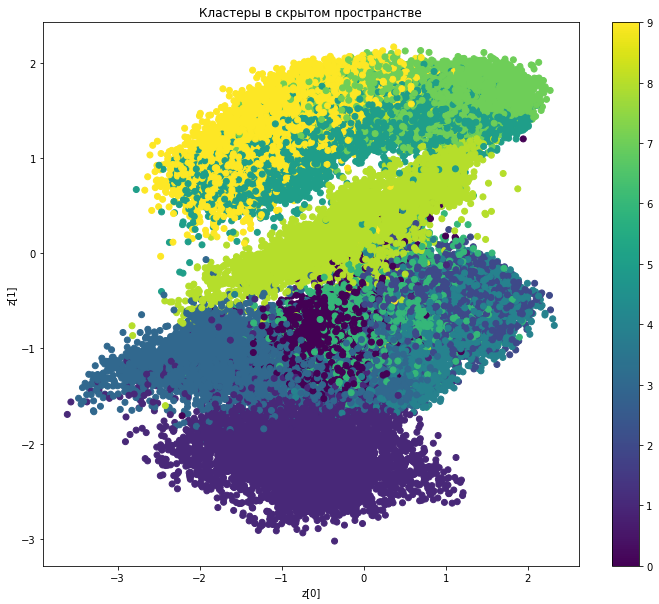

1/1 [==============================] - 0s 23ms/step


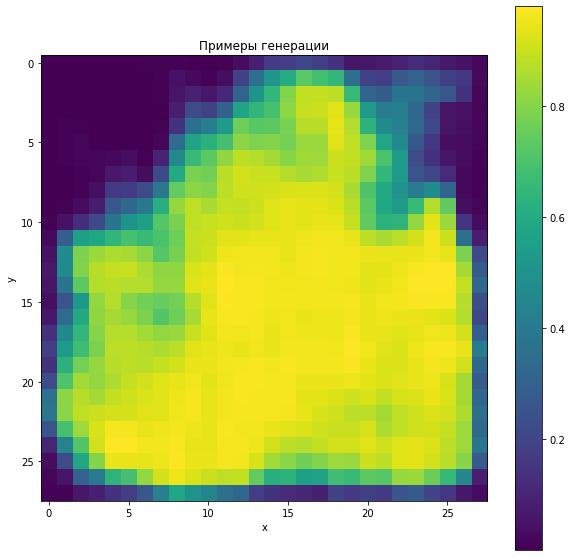

In [ ]:
# Результат предсказания
def plot_latent(encoder, decoder):
    # display a n*n 2D manifold of pics
    n = 30
    pic_size = 28
    scale = 2.0
    figsize = 15
    figure = np.zeros((pic_size * n, pic_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of pic classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi, 0, 0]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
              i * pic_size : (i + 1) * pic_size,
              j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[0, 0, xi, yi]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
              i * pic_size : (i + 1) * pic_size,
              j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[0, xi, yi, 0]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
              i * pic_size : (i + 1) * pic_size,
              j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, 0, 0, yi]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
              i * pic_size : (i + 1) * pic_size,
              j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[0, 0, xi, yi]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
              i * pic_size : (i + 1) * pic_size,
              j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(encoder, decoder)

x_decoded = decoder.predict([[random.uniform(-2.0, 2.0) for _ in range (latent_dim)]])
plt.imshow(x_decoded[0,:,:,0] )
plt.show()

plt.imshow(x_decoded[0,:,:,0] )
plt.show()

# Посмотрим на кластеры в скрытом пространстве
def plot_label_clusters(encoder, data, labels):
    # display a 2D plot of the pic classes in the latent space
    z_mean, _, _ = encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.title("Кластеры в скрытом пространстве")
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()


(x_train, y_train), _ = keras.datasets.fashion_mnist.load_data()
x_train = np.expand_dims(x_train, -1).astype("float32") / 255

plot_label_clusters(encoder, x_train, y_train)

# Построим немного примеров генерации
def plot_pic_from_decoder(decoder, z, pic_size):
    # display a 2D plot of the pic classes in the latent space
    
    data = np.array([[z[i] for i in range(latent_dim)]])
    pic = decoder.predict(data)
    pic = pic.reshape(pic_size, pic_size)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(pic)
    plt.colorbar()
    plt.title("Примеры генерации")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()


plot_pic_from_decoder(decoder, [random.uniform(-2.0, 2.0) for _ in range (latent_dim)], 28)

Субъективно разделение кластеров для латентного пространства размерности 4 выглядит лучше. При этом для размерности 4 сложнее визуально представить содержимое латентного пространства. Однако большое пространство занимают изображения неявно схожие с изначальными фотографиями. 

## Латентное пространство: 8

In [ ]:
# Строим слой семплирования sampling layer
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a picture."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# Строим энкодер encoder
for lat_dim in [8]:
  latent_dim = lat_dim

  encoder_inputs = keras.Input(shape=(28, 28, 1))
  x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
  x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
  x = layers.Flatten()(x)
  x = layers.Dense(8, activation="relu")(x)
  z_mean = layers.Dense(latent_dim, name="z_mean")(x)
  z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
  z = Sampling()([z_mean, z_log_var])
  encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
  encoder.summary()

  # Строим свой decoder
  latent_inputs = keras.Input(shape=(lat_dim,))
  x = layers.Dense(7 * 7 * 2, activation="relu")(latent_inputs)
  x = layers.Reshape((7, 7, 2))(x)
  x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
  x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
  decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
  decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
  decoder.summary()

# Создаем класс модель по `Model` с особым шагом обучения`train_step`
  class VAE(keras.Model):
      def __init__(self, encoder, decoder, **kwargs):
          super(VAE, self).__init__(**kwargs)
          self.encoder = encoder
          self.decoder = decoder

      def train_step(self, data):
          if isinstance(data, tuple):
              data = data[0]
          with tf.GradientTape() as tape:
              z_mean, z_log_var, z = encoder(data)
              reconstruction = decoder(z)
              reconstruction_loss = tf.reduce_mean(keras.losses.binary_crossentropy(data, reconstruction))
              reconstruction_loss *= 28 * 28
              kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
              kl_loss = tf.reduce_mean(kl_loss)
              kl_loss *= -0.5
              total_loss = reconstruction_loss + kl_loss
          grads = tape.gradient(total_loss, self.trainable_weights)
          self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
          return {
              "loss": total_loss,
              "reconstruction_loss": reconstruction_loss,
              "kl_loss": kl_loss,
          }

# Учим VAE
  (x_train, _), (x_test, _) = keras.datasets.fashion_mnist.load_data()
  class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
  fashion_mnist = np.concatenate([x_train, x_test], axis=0)
  fashion_mnist = np.expand_dims(fashion_mnist, -1).astype("float32") / 255

  vae = VAE(encoder, decoder)
  vae.compile(optimizer=keras.optimizers.Adam())
  vae.fit(fashion_mnist, epochs=10, batch_size=128)

  vae.fit(fashion_mnist, epochs=50, batch_size=128, verbose = 0)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_4 (Conv2D)              (None, 14, 14, 32)   320         ['input_5[0][0]']                
                                                                                                  
 conv2d_5 (Conv2D)              (None, 7, 7, 64)     18496       ['conv2d_4[0][0]']               
                                                                                                  
 flatten_2 (Flatten)            (None, 3136)         0           ['conv2d_5[0][0]']               
                                                                                            

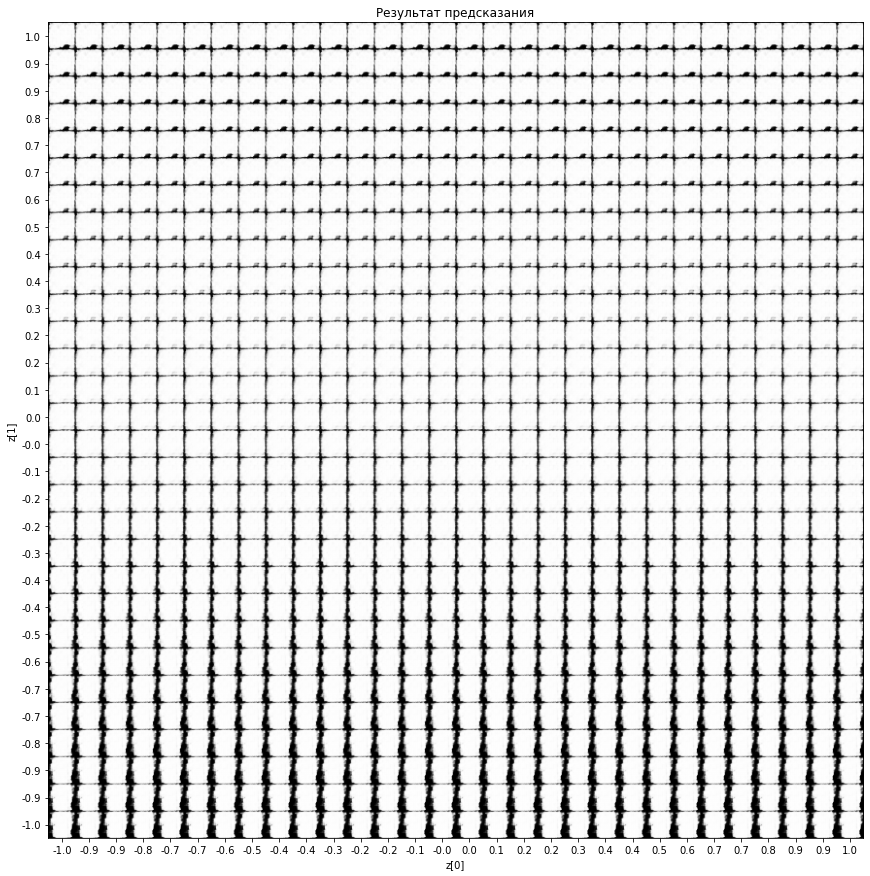

1/1 [==============================] - 0s 42ms/step


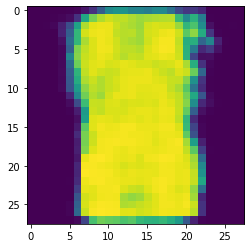

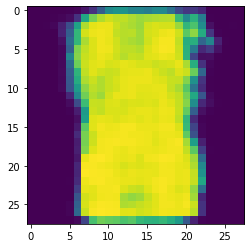

1875/1875 [==============================] - 3s 2ms/step


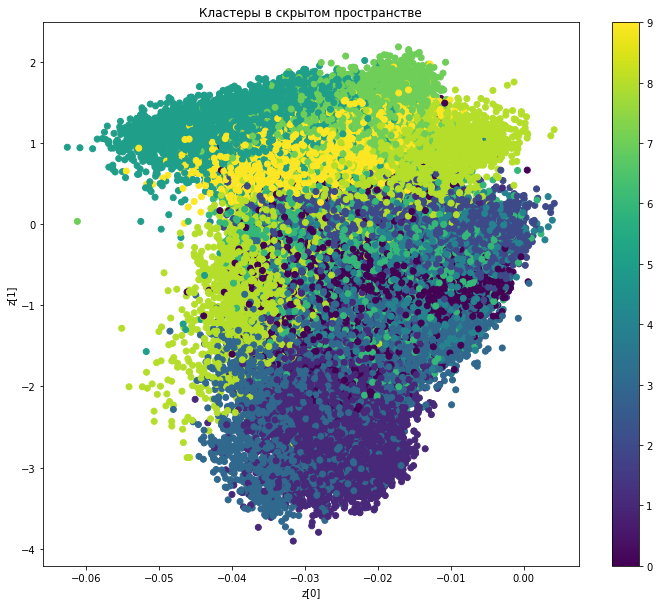

1/1 [==============================] - 0s 21ms/step


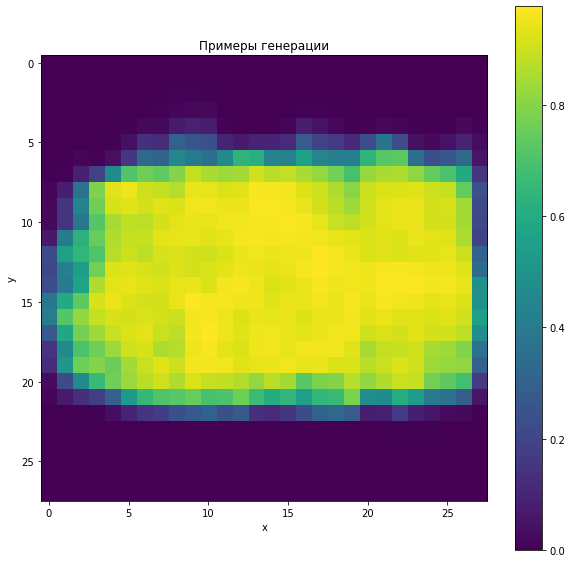

In [ ]:
# Результат предсказания
def plot_latent(encoder, decoder):
    # display a n*n 2D manifold of pics
    n = 30
    pic_size = 28
    scale = 1.0
    figsize = 15
    figure = np.zeros((pic_size * n, pic_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of pic classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi ,0 ,0, 0, 0, 0, 0]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
              i * pic_size : (i + 1) * pic_size,
              j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(encoder, decoder)

x_decoded = decoder.predict([[random.uniform(-2.0, 2.0) for _ in range (8)]])
plt.imshow(x_decoded[0,:,:,0] )
plt.show()

plt.imshow(x_decoded[0,:,:,0] )
plt.show()

# Посмотрим на кластеры в скрытом пространстве
def plot_label_clusters(encoder, data, labels):
    # display a 2D plot of the pic classes in the latent space
    z_mean, _, _ = encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.title("Кластеры в скрытом пространстве")
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()


(x_train, y_train), _ = keras.datasets.fashion_mnist.load_data()
x_train = np.expand_dims(x_train, -1).astype("float32") / 255

plot_label_clusters(encoder, x_train, y_train)

# Построим немного примеров генерации
def plot_pic_from_decoder(decoder, z, pic_size):
    # display a 2D plot of the pic classes in the latent space
    
    data = np.array([[z[i] for i in range(8)]])
    pic = decoder.predict(data)
    pic = pic.reshape(pic_size, pic_size)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(pic)
    plt.colorbar()
    plt.title("Примеры генерации")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()


plot_pic_from_decoder(decoder, [random.uniform(-2.0, 2.0) for _ in range (8)], 28)

Для примера с тем же набором слоев, что в исходном варианте, латентное пространство размерности 8 дает неразборчивый и нечитаемый результат и разделение на кластеры гораздо хуже. 

# Попытка все объединить



In [ ]:
# Строим слой семплирования sampling layer
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a picture."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# Строим энкодер encoder
latent_dim = 4

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(16, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(32, activation="relu")(x)
x = layers.Dense(8, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

# Строим свой decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 2, activation="relu")(latent_inputs)
x = layers.Dense(7 * 7 * 8, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 8))(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

# Создаем класс модель по `Model` с особым шагом обучения`train_step`
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(
                keras.losses.binary_crossentropy(data, reconstruction)
            )
            reconstruction_loss *= 28 * 28
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

# Учим VAE
(x_train, _), (x_test, _) = keras.datasets.fashion_mnist.load_data()
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
fashion_mnist = np.concatenate([x_train, x_test], axis=0)
fashion_mnist = np.expand_dims(fashion_mnist, -1).astype("float32") / 255

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(fashion_mnist, epochs=10, batch_size=128, verbose = 0)

vae.fit(fashion_mnist, epochs=50, batch_size=128)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_37 (InputLayer)          [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_44 (Conv2D)             (None, 14, 14, 16)   160         ['input_37[0][0]']               
                                                                                                  
 max_pooling2d_7 (MaxPooling2D)  (None, 7, 7, 16)    0           ['conv2d_44[0][0]']              
                                                                                                  
 flatten_18 (Flatten)           (None, 784)          0           ['max_pooling2d_7[0][0]']        
                                                                                            

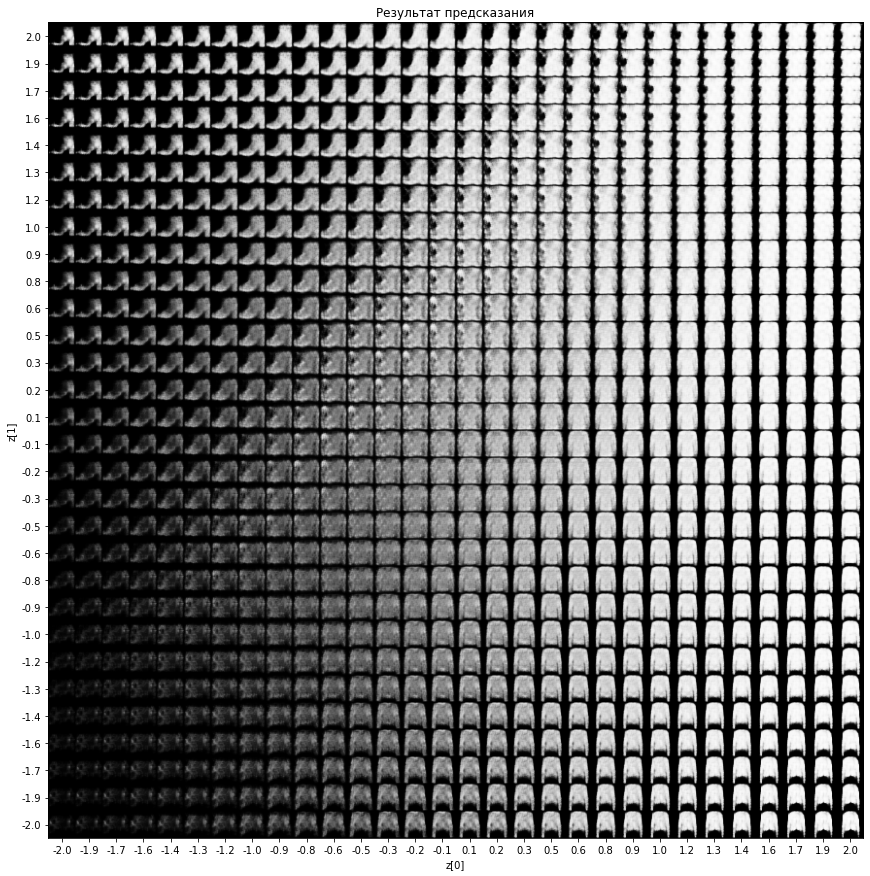

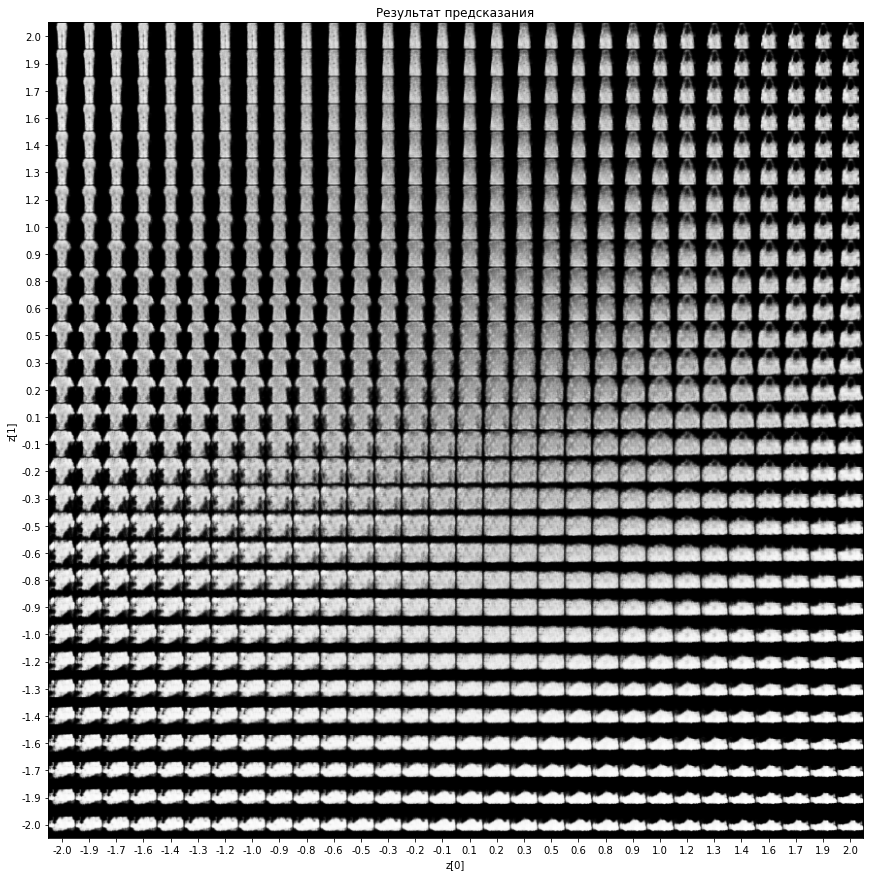

1/1 [==============================] - 0s 41ms/step


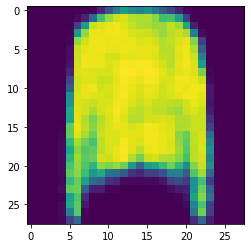

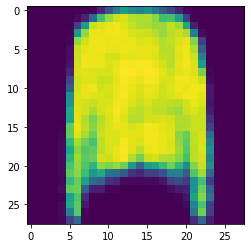

1875/1875 [==============================] - 4s 2ms/step


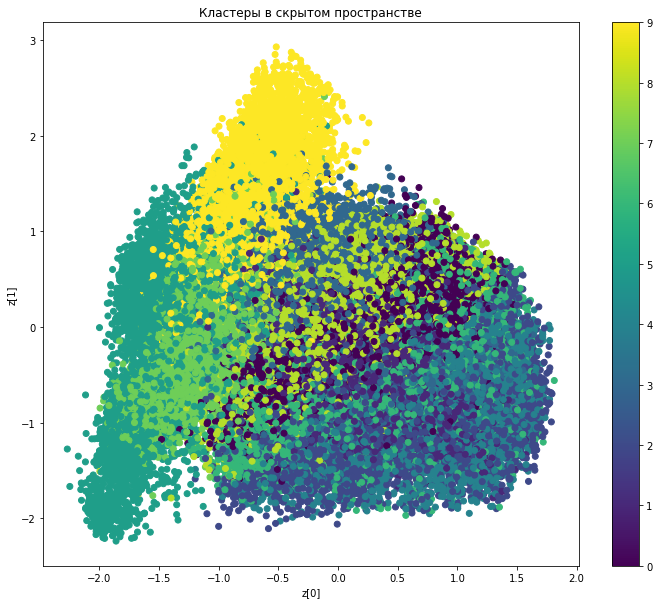

1/1 [==============================] - 0s 30ms/step


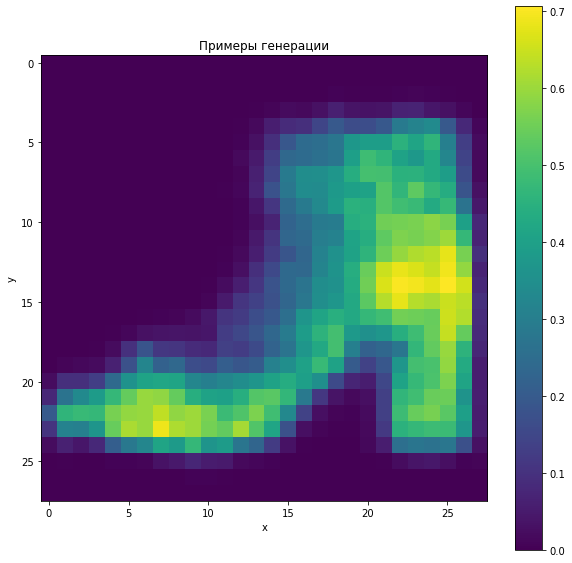

In [ ]:
# Результат предсказания
def plot_latent(encoder, decoder):
    # display a n*n 2D manifold of pics
    n = 30
    pic_size = 28
    scale = 2.0
    figsize = 15
    figure = np.zeros((pic_size * n, pic_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of pic classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi, 0, 0]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
                i * pic_size : (i + 1) * pic_size,
                j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[0, 0, xi, yi]])
            x_decoded = decoder.predict(z_sample, verbose = 0)
            pic = x_decoded[0].reshape(pic_size, pic_size)
            figure[
                i * pic_size : (i + 1) * pic_size,
                j * pic_size : (j + 1) * pic_size,
            ] = pic

    plt.figure(figsize=(figsize, figsize))
    start_range = pic_size // 2
    end_range = n * pic_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, pic_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.title("Результат предсказания")
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(encoder, decoder)

x_decoded = decoder.predict([[1.990,-1.5, 0.0, 0.0]])
plt.imshow(x_decoded[0,:,:,0] )
plt.show()

plt.imshow(x_decoded[0,:,:,0] )
plt.show()

# Посмотрим на кластеры в скрытом пространстве
def plot_label_clusters(encoder, data, labels):
    # display a 2D plot of the pic classes in the latent space
    z_mean, _, _ = encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.title("Кластеры в скрытом пространстве")
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()


(x_train, y_train), _ = keras.datasets.fashion_mnist.load_data()
x_train = np.expand_dims(x_train, -1).astype("float32") / 255

plot_label_clusters(encoder, x_train, y_train)

# Построим немного примеров генерации
def plot_pic_from_decoder(decoder, z, pic_size):
    # display a 2D plot of the pic classes in the latent space
    
    data = np.array([[z[0], z[1], z[2], z[3]]])
    pic = decoder.predict(data)
    pic = pic.reshape(pic_size, pic_size)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(pic)
    plt.colorbar()
    plt.title("Примеры генерации")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()


plot_pic_from_decoder(decoder, [-1.5,1.0, 0.0, 0.0], 28)

Добавление к модели с размерностью латентного пространства = 4 новых слоев привело к улучшению результата.
Визуально кластеры плохо разделены, но латентое пространство имеет размерность 4 и возможно в пространстве кластеры на самом деле разделены лучше. 